In [84]:
# Import necessary libraries 
import cv2
import matplotlib.pyplot as plt
import numpy as np
from skimage.metrics import structural_similarity as ssim
import torch
import torchvision
import torchvision.transforms as transforms
from PIL import Image
import numpy as np

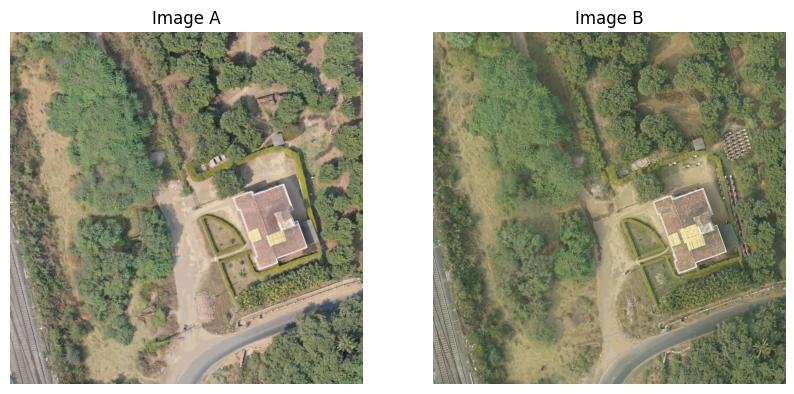

In [85]:
# Please find attached two images A.png and B.png. 
# These are actual ortho-rectified images of a location.
# The objective is find changes between the two images, but following issues need to be addressed:
# (1) "Exact" alignment of images.
imageA = cv2.imread("A.png")
imageB = cv2.imread("B.png")
# Load Images
#Display the images side by side
plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1)
plt.imshow(cv2.cvtColor(imageA, cv2.COLOR_BGR2RGB))
plt.title("Image A")
plt.axis('off')
plt.subplot(1, 2, 2)
plt.imshow(cv2.cvtColor(imageB, cv2.COLOR_BGR2RGB))
plt.title("Image B")
plt.axis('off')
plt.show()



# Check if both Images have *Exact* alignment

In [86]:
if imageA.shape == imageB.shape:
    print("The images have same size and channels")
    difference = cv2.subtract(imageA, imageB)
    b, g, r = cv2.split(difference)
if cv2.countNonZero(b) == 0 and cv2.countNonZero(g) == 0 and cv2.countNonZero(r) == 0:
    print("The images are completely Equal")


The images have same size and channels


In [87]:
# Conver images to grayscale
grayA = cv2.cvtColor(imageA,cv2.COLOR_BGR2GRAY)
grayB = cv2.cvtColor(imageB,cv2.COLOR_BGR2GRAY)

# SHIFT is being used to detect keypoints and compute descriptors
shift = cv2.SIFT_create()
kpA, desA = shift.detectAndCompute(grayA, None)
kpB, desB = shift.detectAndCompute(grayB, None)

# Matching keypoints using FLANN
index_params = dict(algorithm=1, trees=5)
search_params = dict(checks=50)
flann = cv2.FlannBasedMatcher(index_params, search_params)
matches = flann.knnMatch(desA, desB, k=2)



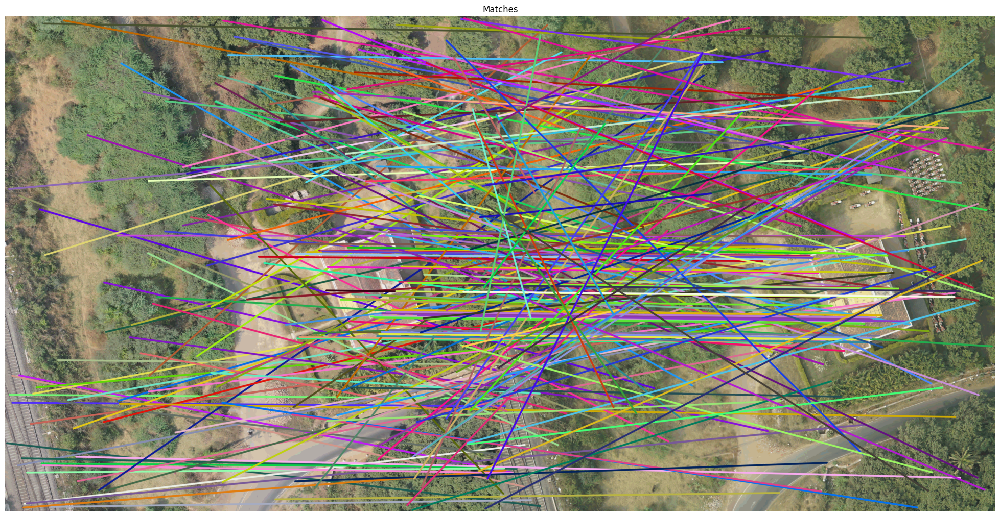

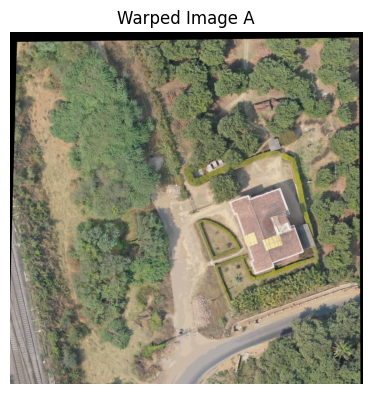

In [88]:
# For good matches, the distance of the best match should be less than 0.75 times the distance of the second best match.
good_matches = []
for m, n in matches:
    if m.distance < 0.75 * n.distance:
        good_matches.append(m)

# Homography matrix estimation (good matches)
src_pts = np.float32([kpA[m.queryIdx].pt for m in good_matches]).reshape(-1, 1, 2)
dst_pts = np.float32([kpB[m.trainIdx].pt for m in good_matches]).reshape(-1, 1, 2)
M, _ = cv2.findHomography(src_pts, dst_pts, cv2.RANSAC, 5.0)

# Draw matches
img_matches = cv2.drawMatches(imageA, kpA, imageB, kpB, good_matches, None,matchesThickness=5, flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)

# Display matches
plt.figure(figsize=(25, 15))
plt.imshow(cv2.cvtColor(img_matches,cv2.COLOR_BGR2RGB))
plt.title('Matches')
plt.axis('off')
plt.show()

# Warp the image A by homography matrix estimation.
warp_img = cv2.warpPerspective(imageA, M, (imageB.shape[1], imageB.shape[0]))

# Visualize the warped image
plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1)
plt.imshow(cv2.cvtColor(warp_img, cv2.COLOR_BGR2RGB))
plt.title("Warped Image A")
plt.axis('off') 

plt.show()



# (2) Correcting for environmental factors (eg, time of day, season, haze/fog).

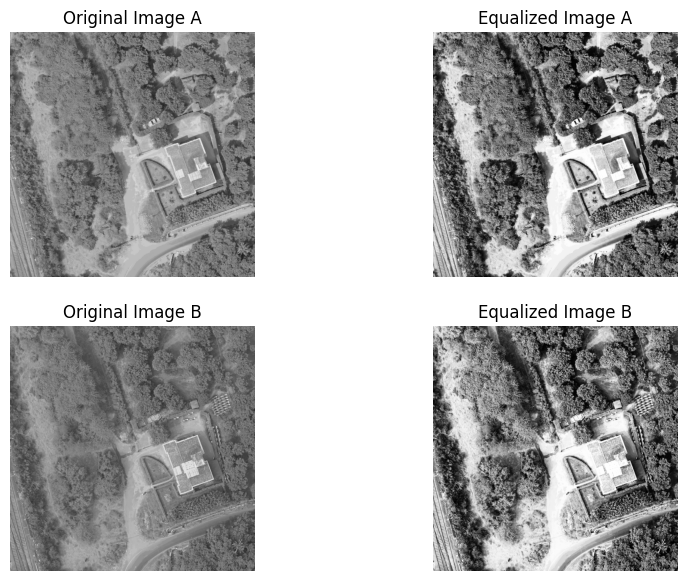

In [89]:
# Apply histogram equalization
eq1 = cv2.equalizeHist(grayA)
eq2 = cv2.equalizeHist(grayB)

# Visualize the warped image
plt.figure(figsize=(10, 7))
plt.subplot(2, 2, 1)
plt.axis('off')
plt.imshow(cv2.cvtColor(grayA, cv2.COLOR_BGR2RGB))
plt.title("Original Image A")
plt.subplot(2, 2, 2)
plt.axis('off') 
plt.imshow(cv2.cvtColor(eq1,cv2.COLOR_BGR2RGB))
plt.title("Equalized Image A")
plt.subplot(2, 2, 3)
plt.axis('off') 
plt.imshow(cv2.cvtColor(grayB,cv2.COLOR_BGR2RGB))
plt.title("Original Image B")
plt.subplot(2, 2, 4)
plt.axis('off') 
plt.imshow(cv2.cvtColor(eq2,cv2.COLOR_BGR2RGB))
plt.title("Equalized Image B")
plt.show()


In [90]:
# the Contrast Limited Adaptive Histogram Equalization (CLAHE) algorithm to dehaze images
clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8))
dehazed_imgA = clahe.apply(grayA)
dehazed_imgB = clahe.apply(grayB)

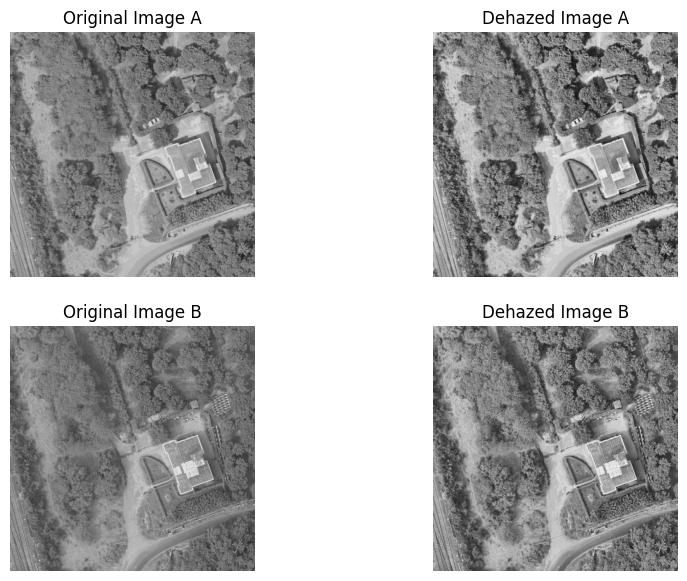

In [91]:

# Visualize the warped image
plt.figure(figsize=(10, 7))
plt.subplot(2, 2, 1)
plt.axis('off')
plt.imshow(cv2.cvtColor(grayA, cv2.COLOR_BGR2RGB))
plt.title("Original Image A")
plt.subplot(2, 2, 2)
plt.axis('off') 
plt.imshow(cv2.cvtColor(dehazed_imgA,cv2.COLOR_BGR2RGB))
plt.title("Dehazed Image A")
plt.subplot(2, 2, 3)
plt.axis('off') 
plt.imshow(cv2.cvtColor(grayB,cv2.COLOR_BGR2RGB))
plt.title("Original Image B")
plt.subplot(2, 2, 4)
plt.axis('off') 
plt.imshow(cv2.cvtColor(dehazed_imgB,cv2.COLOR_BGR2RGB))
plt.title("Dehazed Image B")
plt.show()


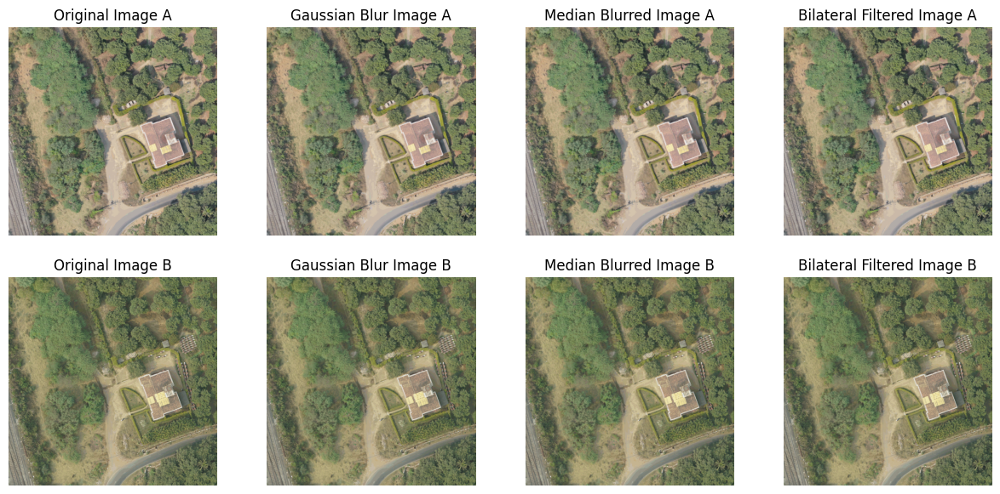

In [92]:
# Image filtering is a technique used to remove noise or enhance certain features in an image. 


# Apply filters
# 1. Gaussian Blur
blurred_imgA = cv2.GaussianBlur(imageA, (5, 5), 0)
blurred_imgB = cv2.GaussianBlur(imageB, (5, 5), 0)

# 2. Median Blur
median_blurred_imgA = cv2.medianBlur(imageA, 5)
median_blurred_imgB = cv2.medianBlur(imageB, 5)

# 3. Bilateral Filter
bilateral_filtered_imgA = cv2.bilateralFilter(imageA, 5, 50, 50)
bilateral_filtered_imgB = cv2.bilateralFilter(imageB, 5, 50, 50)

# Visualize the warped image
plt.figure(figsize=(15, 7))
plt.subplot(2, 4, 1)
plt.axis('off')
plt.imshow(cv2.cvtColor(imageA, cv2.COLOR_BGR2RGB))
plt.title("Original Image A")
plt.subplot(2, 4, 2)
plt.axis('off') 
plt.imshow(cv2.cvtColor(blurred_imgA,cv2.COLOR_BGR2RGB))
plt.title("Gaussian Blur Image A")
plt.subplot(2, 4, 3)
plt.axis('off') 
plt.imshow(cv2.cvtColor(median_blurred_imgA,cv2.COLOR_BGR2RGB))
plt.title("Median Blurred Image A")
plt.subplot(2, 4, 4)
plt.axis('off') 
plt.imshow(cv2.cvtColor(bilateral_filtered_imgA,cv2.COLOR_BGR2RGB))
plt.title("Bilateral Filtered Image A")
plt.subplot(2, 4, 5)
plt.axis('off')
plt.imshow(cv2.cvtColor(imageB, cv2.COLOR_BGR2RGB))
plt.title("Original Image B")
plt.subplot(2, 4, 6)
plt.axis('off') 
plt.imshow(cv2.cvtColor(blurred_imgB,cv2.COLOR_BGR2RGB))
plt.title("Gaussian Blur Image B")
plt.subplot(2, 4, 7)
plt.axis('off') 
plt.imshow(cv2.cvtColor(median_blurred_imgB,cv2.COLOR_BGR2RGB))
plt.title("Median Blurred Image B")
plt.subplot(2, 4, 8)
plt.axis('off') 
plt.imshow(cv2.cvtColor(bilateral_filtered_imgB,cv2.COLOR_BGR2RGB))
plt.title("Bilateral Filtered Image B")
plt.show()


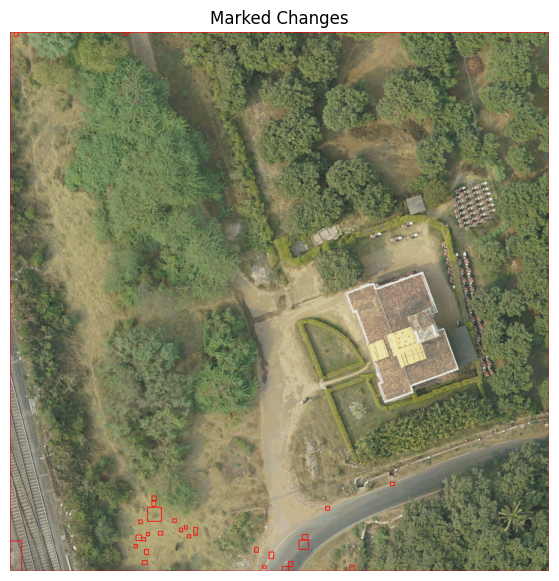

In [93]:

# Compute absolute difference
diff = cv2.absdiff(grayA, grayB)


# # Compute SSIM between the two images Structural Similarity Index (SSIM) + Contours
# score, diff = ssim(grayA, grayB, full=True)
# diff = (diff * 255).astype("uint8")

# Threshold the difference
_, thresh = cv2.threshold(diff, 0, 255, cv2.THRESH_BINARY | cv2.THRESH_OTSU)

# Optional: dilate to enhance
kernel = np.ones((5, 5), np.uint8)
dilated = cv2.dilate(thresh, kernel, iterations=2)

# Find contours of the changes
contours, _ = cv2.findContours(dilated, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

# Draw bounding boxes on the original image
marked_img = imageB.copy()
for contour in contours:
    if cv2.contourArea(contour) > 100:  # filter small changes
        x, y, w, h = cv2.boundingRect(contour)
        cv2.rectangle(marked_img, (x, y), (x + w, y + h), (0, 0,255), 2)

plt.figure(figsize=(10, 7))
plt.axis('off')
plt.imshow(cv2.cvtColor(marked_img, cv2.COLOR_BGR2RGB))
plt.title("Marked Changes")
plt.show()



# Display the result
# cv2.imshow("Detected Changes", marked_img)
# cv2.waitKey(0)
# cv2.destroyAllWindows()


Downloading: "https://github.com/facebookresearch/dino/zipball/main" to C:\Users\91776/.cache\torch\hub\main.zip
Downloading: "https://dl.fbaipublicfiles.com/dino/dino_deitsmall16_pretrain/dino_deitsmall16_pretrain.pth" to C:\Users\91776/.cache\torch\hub\checkpoints\dino_deitsmall16_pretrain.pth


100%|██████████| 82.7M/82.7M [00:06<00:00, 13.3MB/s]


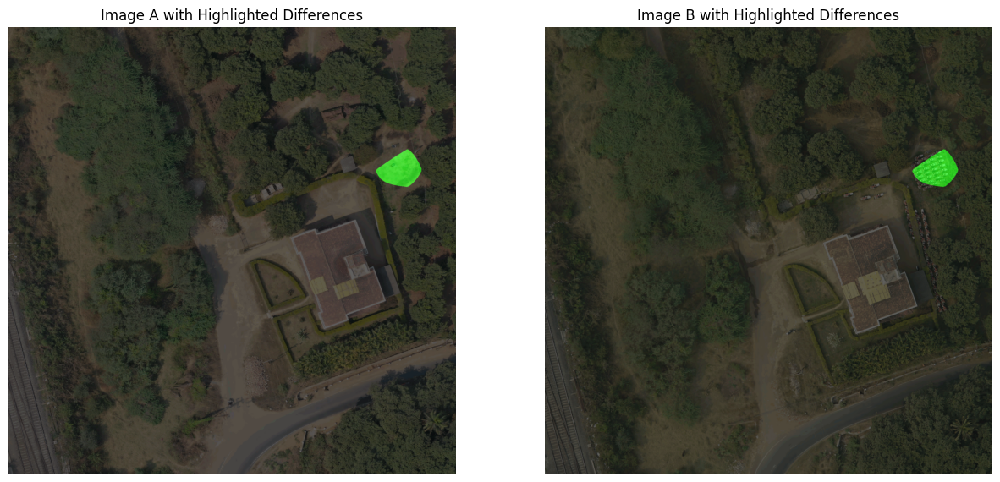

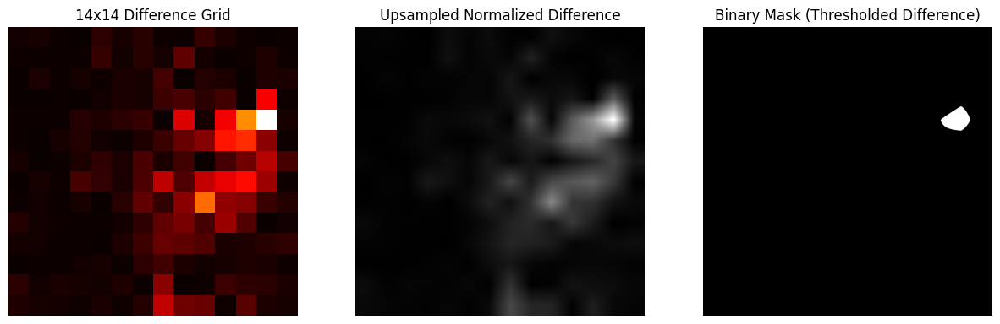

In [94]:
# Load pre-trained ViT model
model = torch.hub.load('facebookresearch/dino:main', 'dino_vits16', force_reload=False)

# Load images
# Load using PIL for consistency with previous parts, but also keep a cv2 version for drawing
imgA_pil = Image.open('A.png').convert('RGB')
imgB_pil = Image.open('B.png').convert('RGB')

# Load cv2 versions for drawing
imgA_cv2 = cv2.imread('A.png')
imgB_cv2 = cv2.imread('B.png')

# Ensure the cv2 images are not None
if imgA_cv2 is None or imgB_cv2 is None:
    print("Error: Could not load images using cv2. Check file paths.")
else:
    # Convert BGR to RGB for plotting with matplotlib later
    imgA_cv2_rgb = cv2.cvtColor(imgA_cv2, cv2.COLOR_BGR2RGB)
    imgB_cv2_rgb = cv2.cvtColor(imgB_cv2, cv2.COLOR_BGR2RGB)


    # Preprocess images
    transform = transforms.Compose([
        transforms.Resize(256),
        transforms.CenterCrop(224),
        transforms.ToTensor(),
        transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
    ])

    imgA_tensor = transform(imgA_pil).unsqueeze(0)
    imgB_tensor = transform(imgB_pil).unsqueeze(0)

    # Get attention maps
# This code uses a forward hook to extract the attention weights from the final attention layer of a ViT model during inference.
# These attention weights can then be analyzed to understand where the model is focusing its attention in the input image.
# The subsequent parts of the notebook code would then likely use these attention maps to visualize the areas of interest or 
# calculate differences between maps from different images.
    def get_attention_maps(img, model):
        attn_maps_list = []
        def hook(module, input, output):
            attn_maps_list.append(output[1].detach())
        handle = model.blocks[-1].attn.register_forward_hook(hook)
        model(img)
        handle.remove()
        return attn_maps_list[0]

    # Get attention maps
    attn_maps1 = get_attention_maps(imgA_tensor, model)
    attn_maps2 = get_attention_maps(imgB_tensor, model)

    # Extract the class token to patch token attention for the first head
    attn_map1_cls_patch = attn_maps1[0, 0, 0, 1:]
    attn_map2_cls_patch = attn_maps2[0, 0, 0, 1:]

    # Reshape to 14x14 grid
    attn_grid1 = attn_map1_cls_patch.reshape(14, 14)
    attn_grid2 = attn_map2_cls_patch.reshape(14, 14)

    # Calculate difference between attention maps
    diff_grid = torch.abs(attn_grid1 - attn_grid2)

    # --- Visualization of the difference on original images ---

    # Convert difference grid to numpy
    diff_grid_np = diff_grid.numpy()

    # Upsample the difference grid to the original image size
    # The original image size can be different from 224x224 after preprocessing.
    # Let's use the original cv2 image shape for upsampling.
    original_height, original_width, _ = imgA_cv2.shape

    # The DINO model was likely trained with 16x16 patches.
    # So the 14x14 grid corresponds to 196 patches covering the 224x224 input.
    # To scale back to the original image size, we need to consider how the 224x224
    # input relates to the original image (due to resize and center crop).

    # A simple approach is to upsample the 14x14 grid to the size of the input tensor (224x224)
    # and then resize that to the original image size.
    upsample_to_input_size = cv2.resize(diff_grid_np, (224, 224), interpolation=cv2.INTER_LINEAR)
    upsampled_diff = cv2.resize(upsample_to_input_size, (original_width, original_height), interpolation=cv2.INTER_LINEAR)


    # Normalize the upsampled difference map to 0-255 for visualization
    upsampled_diff_normalized = cv2.normalize(upsampled_diff, None, 0, 255, cv2.NORM_MINMAX)
    upsampled_diff_normalized = upsampled_diff_normalized.astype(np.uint8)

    # Apply a colormap (e.g., JET) to the normalized difference map
    heatmap = cv2.applyColorMap(upsampled_diff_normalized, cv2.COLORMAP_JET)

    # Define a threshold for highlighting. You may need to tune this value.
    # A simple approach is to threshold based on the normalized values.
    threshold_value = 150 # Example threshold, adjust as needed

    # Create a binary mask from the thresholded difference map
    _, mask = cv2.threshold(upsampled_diff_normalized, threshold_value, 255, cv2.THRESH_BINARY)

    # Convert the mask to a 3-channel image to mix with the color image
    mask_3_channel = cv2.cvtColor(mask, cv2.COLOR_GRAY2BGR)

    # Overlay the heatmap on the original images
    # We can mix the original image with the heatmap based on the mask
    # Create a colored overlay only in the masked areas
    overlay_color = (0, 255, 0) # Green color for highlighting
    colored_overlay = np.zeros_like(imgA_cv2_rgb)
    colored_overlay[mask > 0] = overlay_color

    # Blend the original image with the colored overlay
    # You can adjust the alpha value for transparency (e.g., 0.5 for 50% transparency)
    alpha = 0.6 # Transparency factor
    highlighted_imgA = cv2.addWeighted(imgA_cv2_rgb, 1 - alpha, colored_overlay, alpha, 0)
    highlighted_imgB = cv2.addWeighted(imgB_cv2_rgb, 1 - alpha, colored_overlay, alpha, 0)


    # Display the images with highlighted areas
    plt.figure(figsize=(15, 7))

    plt.subplot(1, 2, 1)
    plt.imshow(highlighted_imgA)
    plt.title('Image A with Highlighted Differences')
    plt.axis('off')

    plt.subplot(1, 2, 2)
    plt.imshow(highlighted_imgB)
    plt.title('Image B with Highlighted Differences')
    plt.axis('off')

    plt.show()

    # Optional: Display the difference map and the mask for debugging/understanding
    plt.figure(figsize=(15, 5))
    plt.subplot(1, 3, 1)
    plt.imshow(diff_grid_np, cmap='hot', interpolation='nearest')
    plt.title('14x14 Difference Grid')
    plt.axis('off')

    plt.subplot(1, 3, 2)
    plt.imshow(upsampled_diff_normalized, cmap='gray')
    plt.title('Upsampled Normalized Difference')
    plt.axis('off')

    plt.subplot(1, 3, 3)
    plt.imshow(mask, cmap='gray')
    plt.title('Binary Mask (Thresholded Difference)')
    plt.axis('off')

    plt.show()